In [1]:
freq = 15

In [2]:
paciente='paciente4'

In [3]:
import codigo
from codigo import utils
from codigo import model_LSTM
from codigo import model_utils
from cg_ega.cg_ega import CG_EGA

In [4]:
import pandas as pd
import numpy as np
pd.set_option('mode.chained_assignment',None)
import matplotlib.pyplot as plt
import seaborn as sns
import math

%matplotlib inline

In [5]:
import tensorflow as tf
from tensorflow import keras

In [6]:
with open('dataset/generado/'+paciente+'/array_Xtest.npy', 'rb') as f:
    array_Xtest = np.load(f)

In [7]:
len(array_Xtest)

6201

In [8]:
with open('dataset/generado/'+paciente+'/array_Ytest.npy', 'rb') as f:
    array_Ytest = np.load(f)

In [9]:
len(array_Ytest)

6201

# Pruebas Vanilla LSTM con dropout

In [10]:
model = keras.models.load_model('modelos/'+paciente+'/vanilla_dropout.h5')

In [11]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [12]:
len(array_Ytest)

6201

194/194 [==============================] - 1s 5ms/step


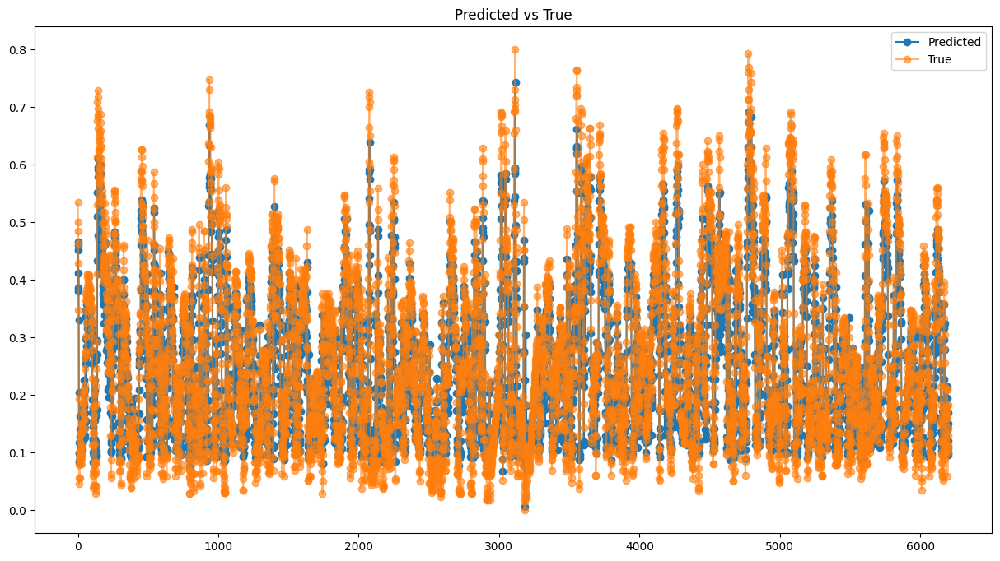

In [13]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [14]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.04582503902480089,
 'mse': 0.0601606577126006,
 'rmse': 0.0036193047364126906}

In [15]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,251.480164
1,254.345078
2,247.655853
3,217.597519
4,229.281021
...,...
6196,86.296471
6197,117.735840
6198,95.081322
6199,90.101471


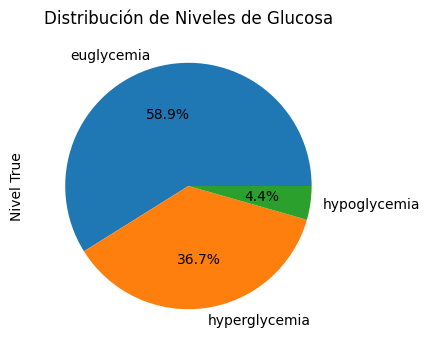

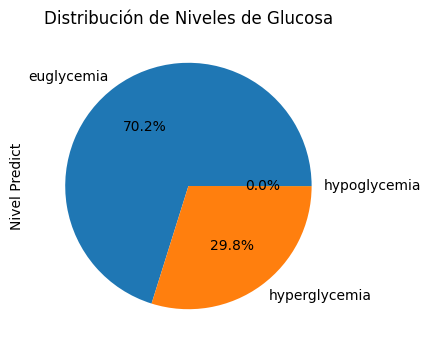

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,251.480164,hyperglycemia
1,270.0,hyperglycemia,254.345078,hyperglycemia
2,263.0,hyperglycemia,247.655853,hyperglycemia
3,253.0,hyperglycemia,217.597519,hyperglycemia
4,237.0,hyperglycemia,229.281021,hyperglycemia


In [16]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


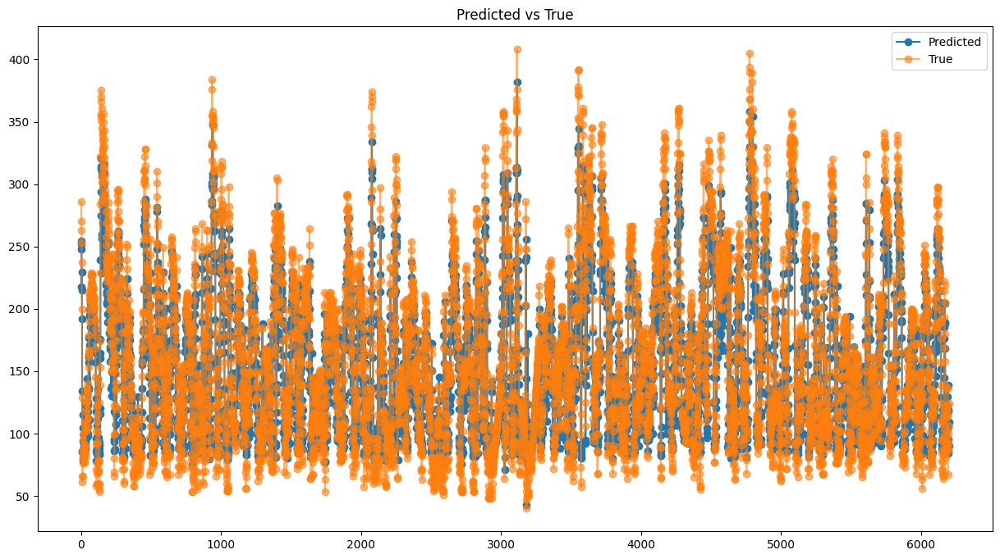

{'mae': 21.079517935183176, 'mse': 27.6739029489778, 'rmse': 765.8449044294422}

In [17]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [18]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [19]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,251.480164
2023-01-01 00:15:00,270.0,254.345078
2023-01-01 00:30:00,263.0,247.655853
2023-01-01 00:45:00,253.0,217.597519
2023-01-01 01:00:00,237.0,229.281021
...,...,...
2023-03-06 13:00:00,100.0,86.296471
2023-03-06 13:15:00,89.0,117.735840
2023-03-06 13:30:00,92.0,95.081322
2023-03-06 13:45:00,106.0,90.101471


AP, BE, EP: (0.8330645161290322, 0.09306451612903226, 0.07387096774193548)


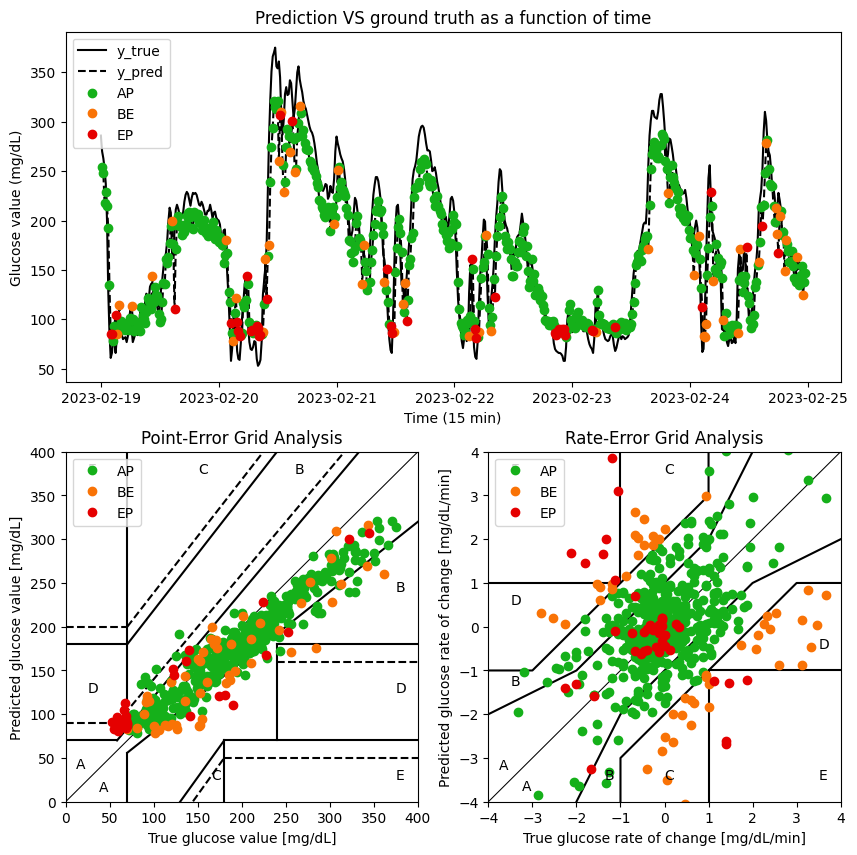

In [20]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [21]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,251.480164,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,254.345078,-1.066667,0.190994,AP,A,B
2,2023-02-19 00:30:00,263.0,247.655853,-0.466667,-0.445948,AP,A,A
3,2023-02-19 00:45:00,253.0,217.597519,-0.666667,-2.003889,AP,A,B
4,2023-02-19 01:00:00,237.0,229.281021,-1.066667,0.778900,AP,A,B
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,86.296471,0.933333,0.158578,AP,A,A
6197,2023-04-24 13:15:00,89.0,117.735840,-0.733333,2.095958,BE,B,uC
6198,2023-04-24 13:30:00,92.0,95.081322,0.200000,-1.510301,AP,A,B
6199,2023-04-24 13:45:00,106.0,90.101471,0.933333,-0.331990,AP,A,B


# Predicción a 60 min del conjunto de pruebas generales

In [22]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [23]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 23ms/step


,Glucose level Predict,Glucose level True
0,0.459739,0.534783
1,0.465967,0.500000


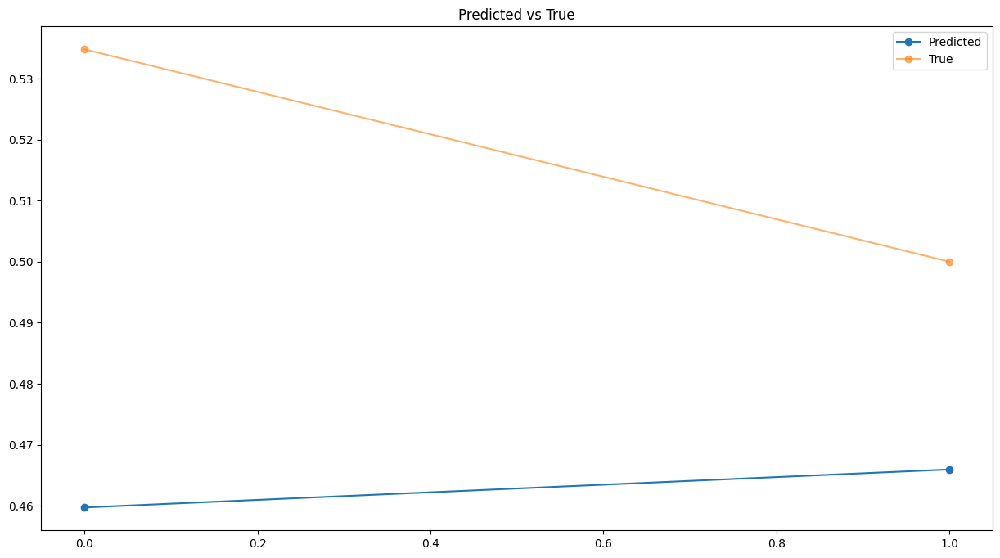

{'mae': 0.05453782794268236,
 'mse': 0.058265274234120625,
 'rmse': 0.003394842181577281}

In [24]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [25]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,251.480164,286.0
1,254.345032,270.0


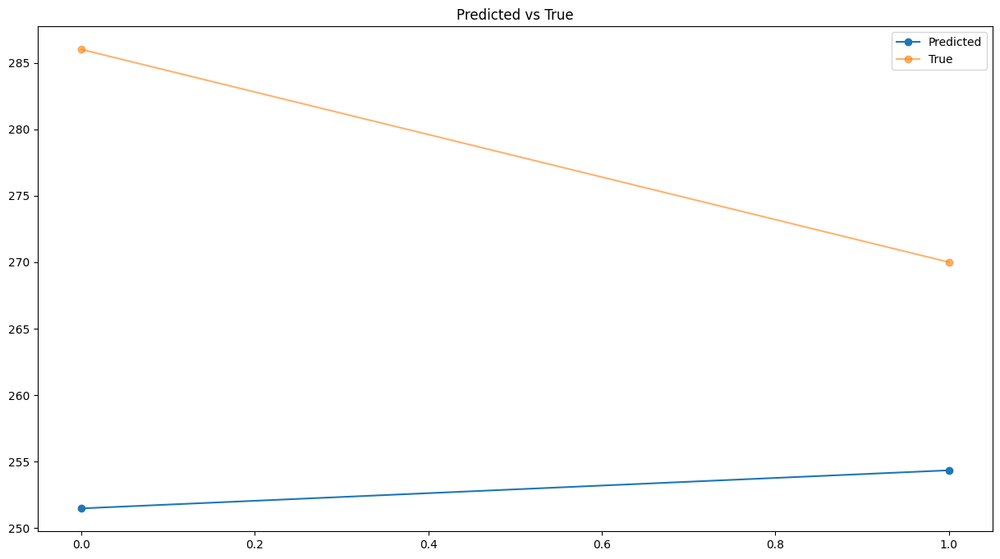

{'mae': 25.08740234374997, 'mse': 26.80202546579375, 'rmse': 718.3485690690568}

In [26]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Vanilla LSTM sin dropout

In [27]:
model = keras.models.load_model('modelos/'+paciente+'/vanilla_NO_dropout.h5')

In [28]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [29]:
len(array_Ytest)

6201

194/194 [==============================] - 1s 4ms/step


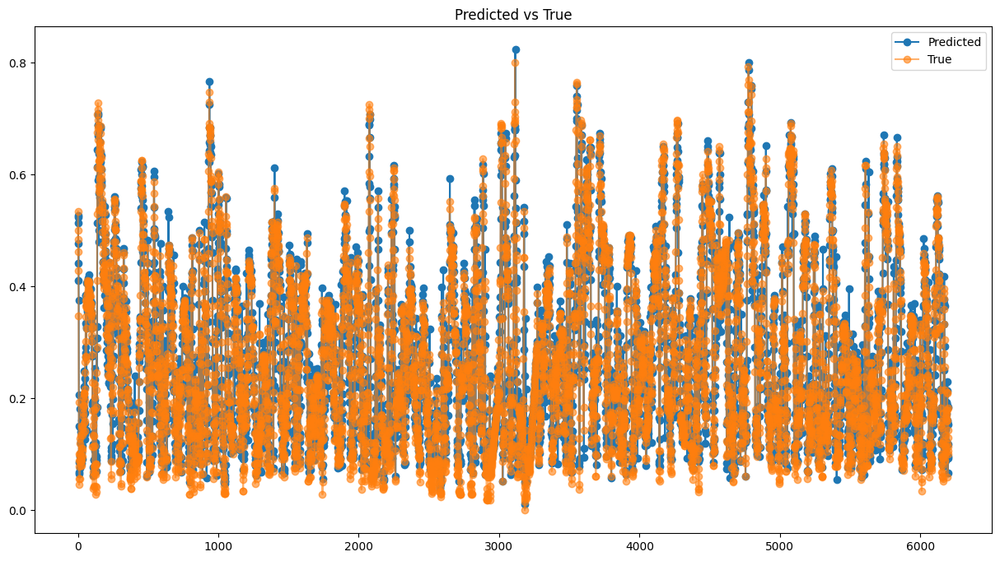

In [30]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [31]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.035317084403434285,
 'mse': 0.049489191228392085,
 'rmse': 0.00244918004844036}

In [32]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,282.251587
1,280.900085
2,276.411072
3,243.436066
4,259.248352
...,...
6196,83.003868
6197,124.521576
6198,94.080605
6199,83.985069


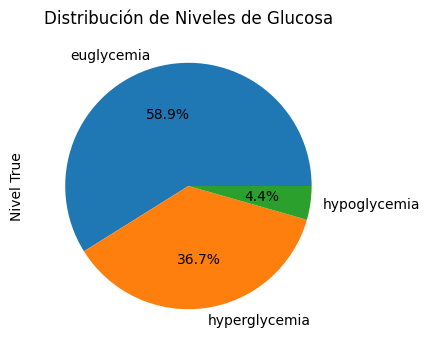

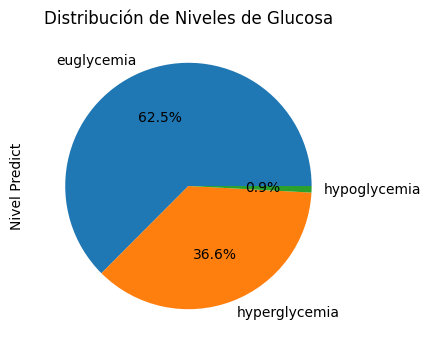

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,282.251587,hyperglycemia
1,270.0,hyperglycemia,280.900085,hyperglycemia
2,263.0,hyperglycemia,276.411072,hyperglycemia
3,253.0,hyperglycemia,243.436066,hyperglycemia
4,237.0,hyperglycemia,259.248352,hyperglycemia


In [33]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


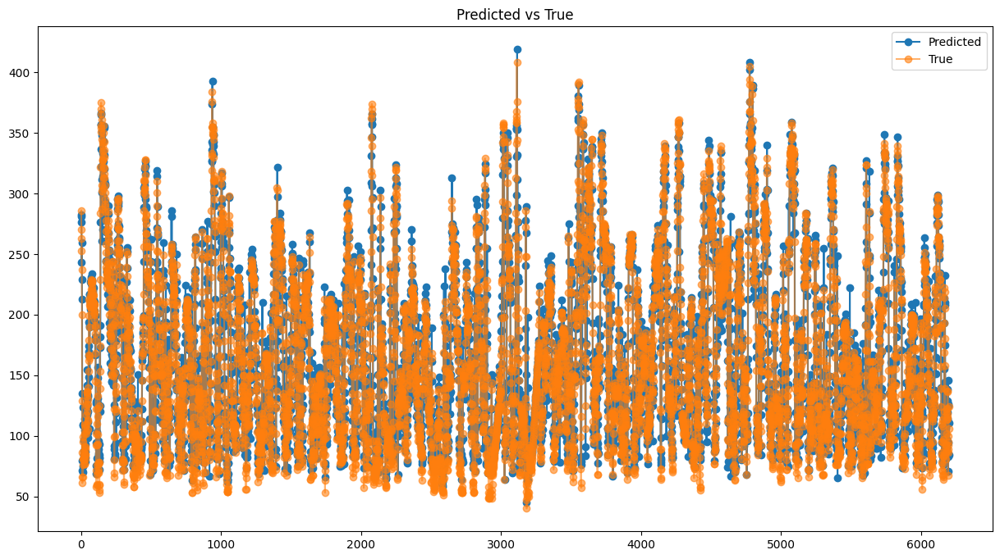

{'mae': 16.245858996165747,
 'mse': 22.76502810141636,
 'rmse': 518.2465044582765}

In [34]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [35]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [36]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,282.251587
2023-01-01 00:15:00,270.0,280.900085
2023-01-01 00:30:00,263.0,276.411072
2023-01-01 00:45:00,253.0,243.436066
2023-01-01 01:00:00,237.0,259.248352
...,...,...
2023-03-06 13:00:00,100.0,83.003868
2023-03-06 13:15:00,89.0,124.521576
2023-03-06 13:30:00,92.0,94.080605
2023-03-06 13:45:00,106.0,83.985069


AP, BE, EP: (0.8119354838709677, 0.12161290322580645, 0.0664516129032258)


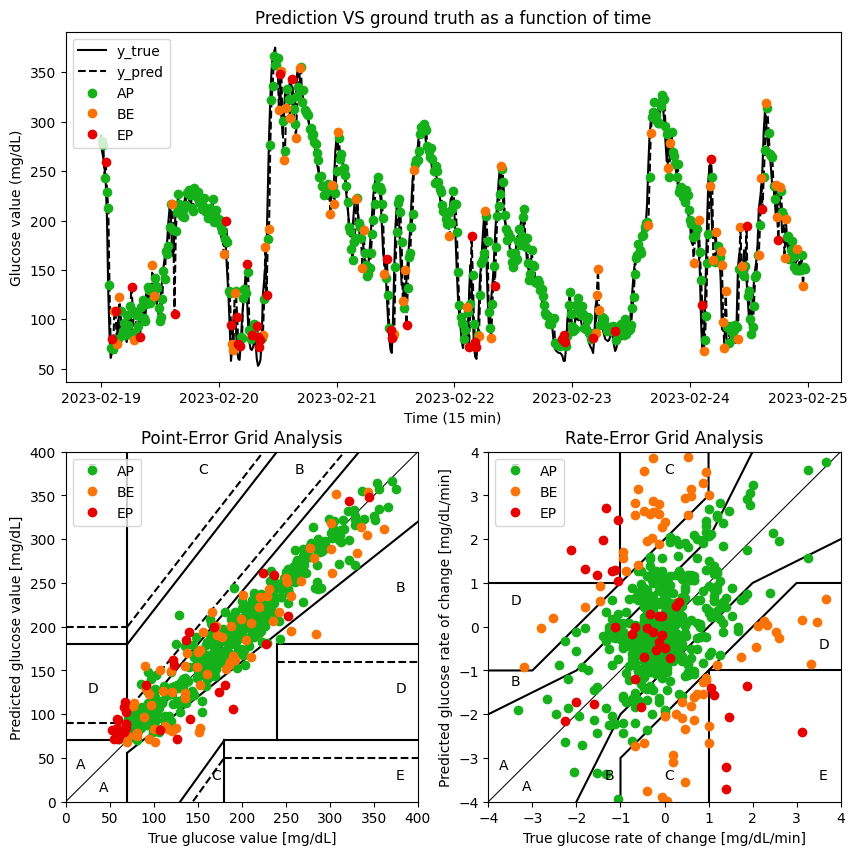

In [37]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [38]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,282.251587,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,280.900085,-1.066667,-0.090100,AP,A,A
2,2023-02-19 00:30:00,263.0,276.411072,-0.466667,-0.299268,AP,A,A
3,2023-02-19 00:45:00,253.0,243.436066,-0.666667,-2.198334,AP,A,B
4,2023-02-19 01:00:00,237.0,259.248352,-1.066667,1.054152,EP,A,uE
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,83.003868,0.933333,0.829520,AP,A,A
6197,2023-04-24 13:15:00,89.0,124.521576,-0.733333,2.767847,BE,B,uC
6198,2023-04-24 13:30:00,92.0,94.080605,0.200000,-2.029398,BE,A,lC
6199,2023-04-24 13:45:00,106.0,83.985069,0.933333,-0.673036,AP,B,B


# Predicción a 60 min del conjunto de pruebas generales

In [39]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [40]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 22ms/step


,Glucose level Predict,Glucose level True
0,0.526634,0.534783
1,0.523696,0.500000


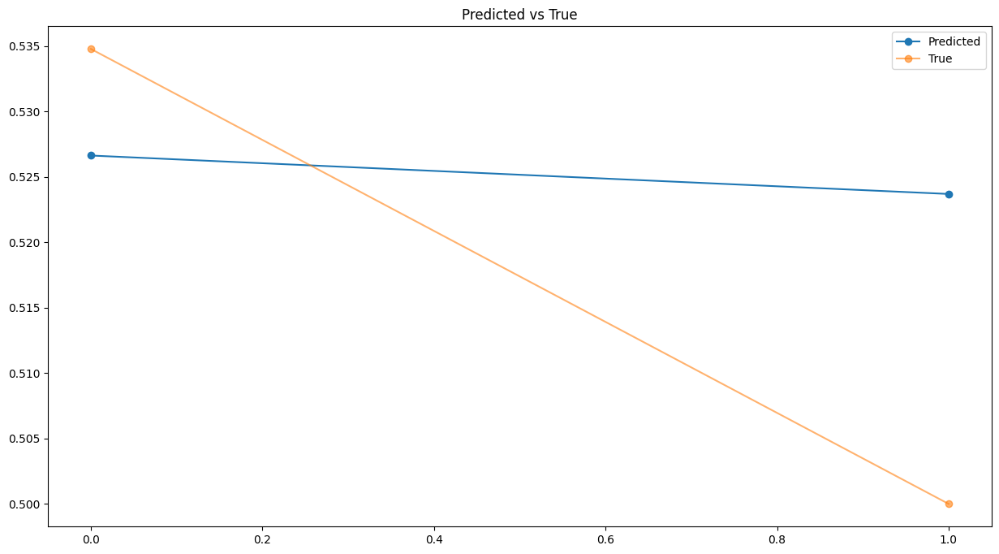

{'mae': 0.015922228668047045,
 'mse': 0.01771850057997321,
 'rmse': 0.00031394526280251097}

In [41]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [42]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,282.251587,286.0
1,280.900055,270.0


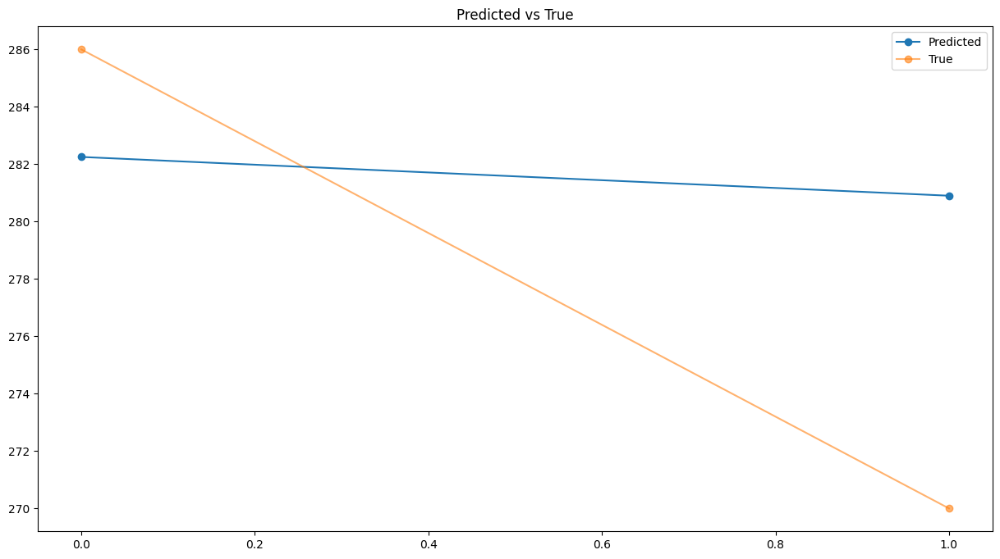

{'mae': 7.324234008789091, 'mse': 8.150515265172253, 'rmse': 66.43089908780593}

In [43]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Stacked LSTM con dropout

In [44]:
model = keras.models.load_model('modelos/'+paciente+'/stacked_dropout.h5')

In [45]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [46]:
len(array_Ytest)

6201

194/194 [==============================] - 2s 7ms/step


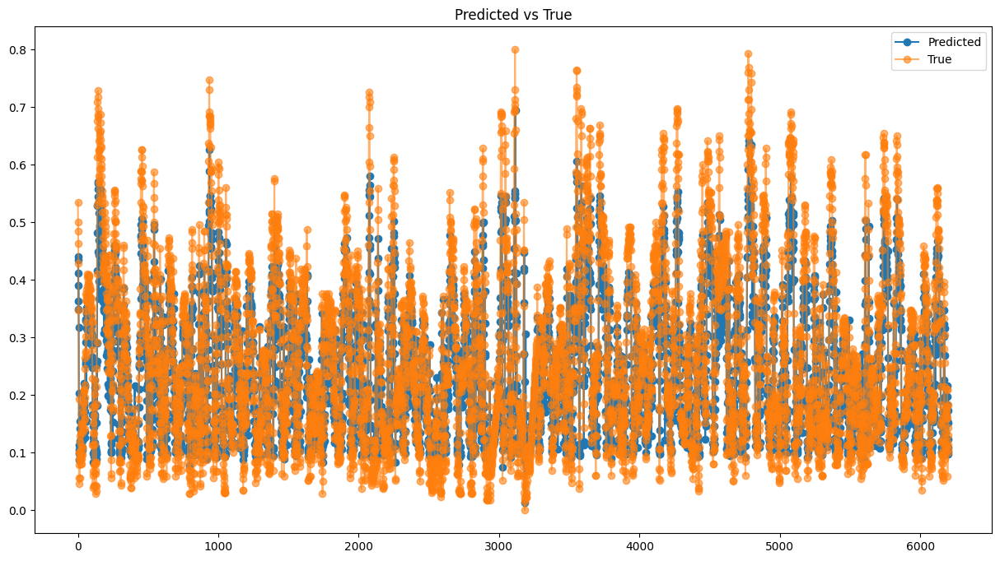

In [47]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [48]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.05059496310426179,
 'mse': 0.06685035123537042,
 'rmse': 0.004468969460292392}

In [49]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,240.024918
1,242.674774
2,229.478195
3,207.267258
4,219.802963
...,...
6196,86.736366
6197,119.709297
6198,96.736168
6199,89.951180


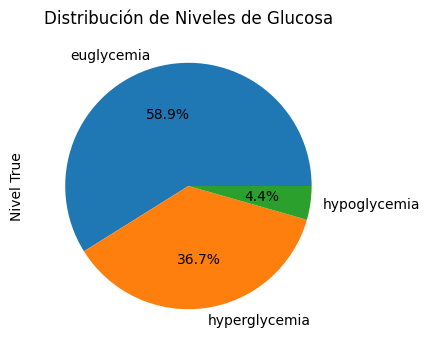

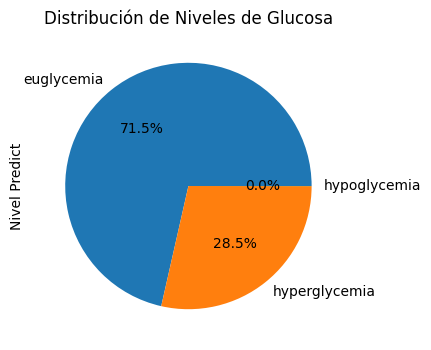

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,240.024918,hyperglycemia
1,270.0,hyperglycemia,242.674774,hyperglycemia
2,263.0,hyperglycemia,229.478195,hyperglycemia
3,253.0,hyperglycemia,207.267258,hyperglycemia
4,237.0,hyperglycemia,219.802963,hyperglycemia


In [50]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


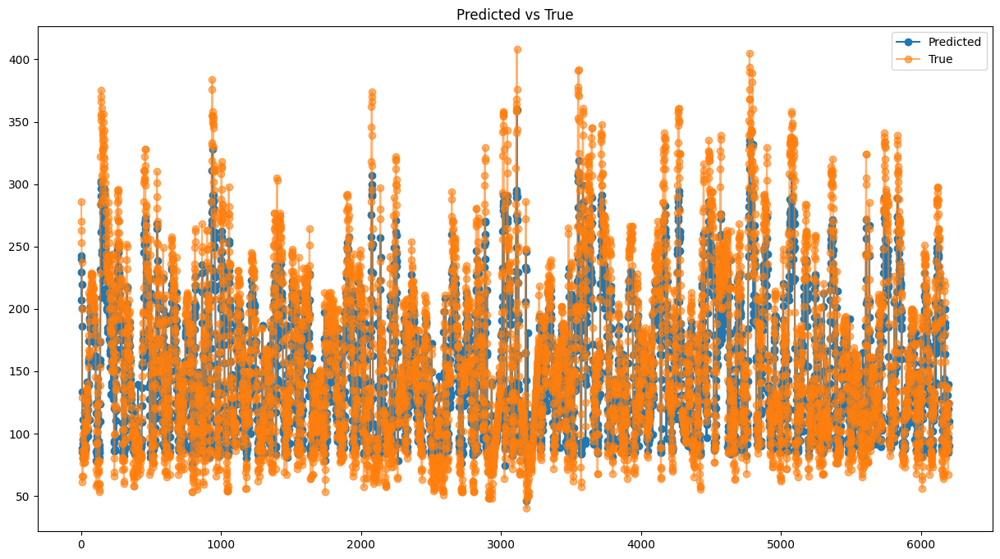

{'mae': 23.273682184017865,
 'mse': 30.751161047069115,
 'rmse': 945.6339057427809}

In [51]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [52]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [53]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,240.024918
2023-01-01 00:15:00,270.0,242.674774
2023-01-01 00:30:00,263.0,229.478195
2023-01-01 00:45:00,253.0,207.267258
2023-01-01 01:00:00,237.0,219.802963
...,...,...
2023-03-06 13:00:00,100.0,86.736366
2023-03-06 13:15:00,89.0,119.709297
2023-03-06 13:30:00,92.0,96.736168
2023-03-06 13:45:00,106.0,89.951180


AP, BE, EP: (0.837741935483871, 0.08903225806451613, 0.0732258064516129)


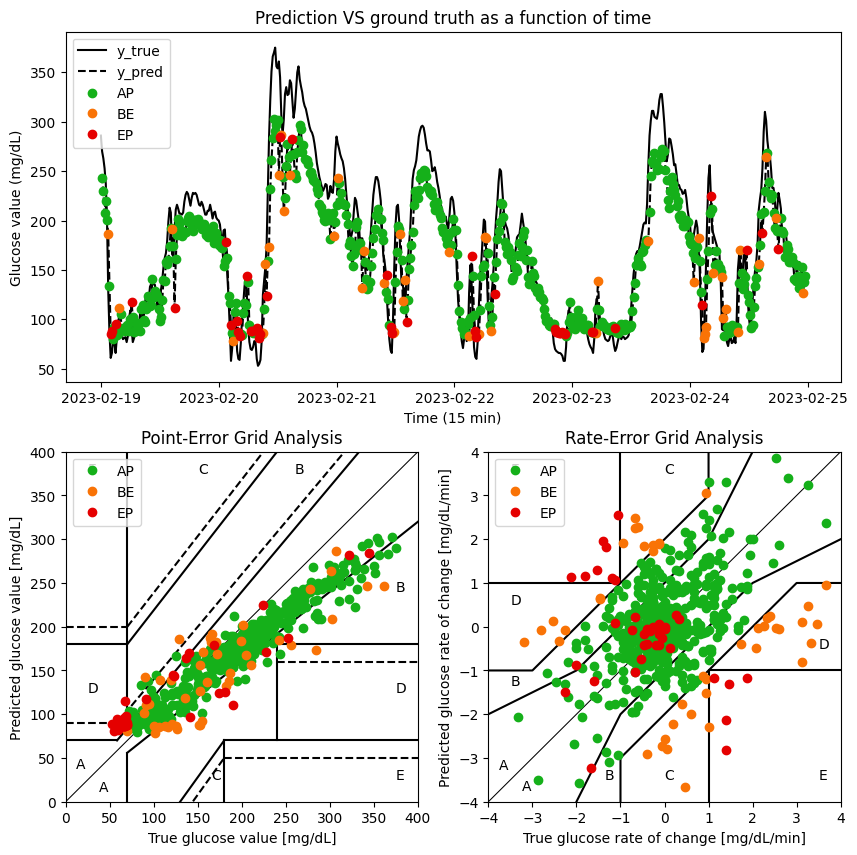

In [54]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [55]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,240.024918,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,242.674774,-1.066667,0.176657,AP,A,B
2,2023-02-19 00:30:00,263.0,229.478195,-0.466667,-0.879772,AP,A,A
3,2023-02-19 00:45:00,253.0,207.267258,-0.666667,-1.480729,AP,A,A
4,2023-02-19 01:00:00,237.0,219.802963,-1.066667,0.835714,AP,A,B
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,86.736366,0.933333,0.141695,AP,A,A
6197,2023-04-24 13:15:00,89.0,119.709297,-0.733333,2.198195,BE,B,uC
6198,2023-04-24 13:30:00,92.0,96.736168,0.200000,-1.531542,AP,A,B
6199,2023-04-24 13:45:00,106.0,89.951180,0.933333,-0.452333,AP,A,B


# Predicción a 60 min del conjunto de pruebas generales

In [56]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [57]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 26ms/step


,Glucose level Predict,Glucose level True
0,0.434837,0.534783
1,0.440597,0.500000


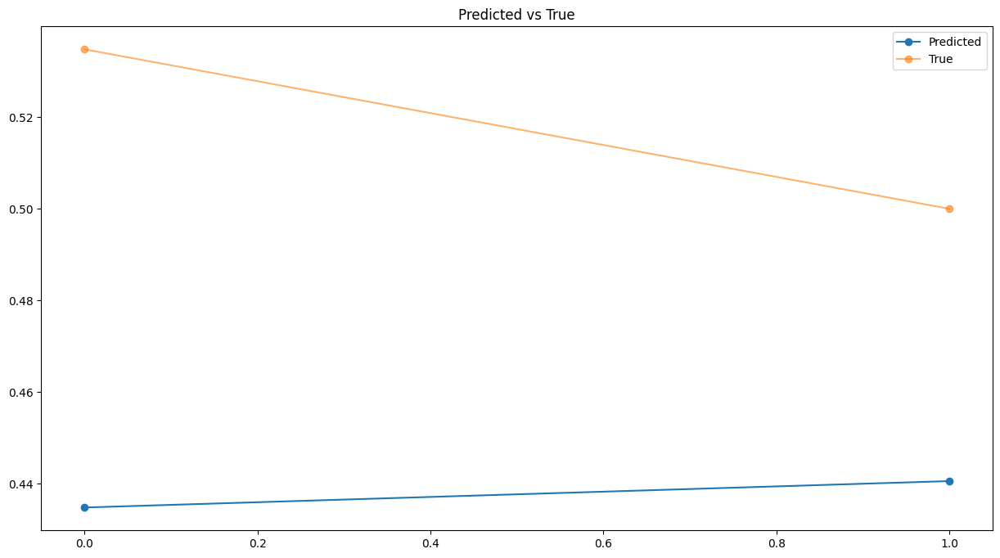

{'mae': 0.07967425403387651,
 'mse': 0.0822126662196601,
 'rmse': 0.006758922486945241}

In [58]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [59]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,240.024918,286.0
1,242.674744,270.0


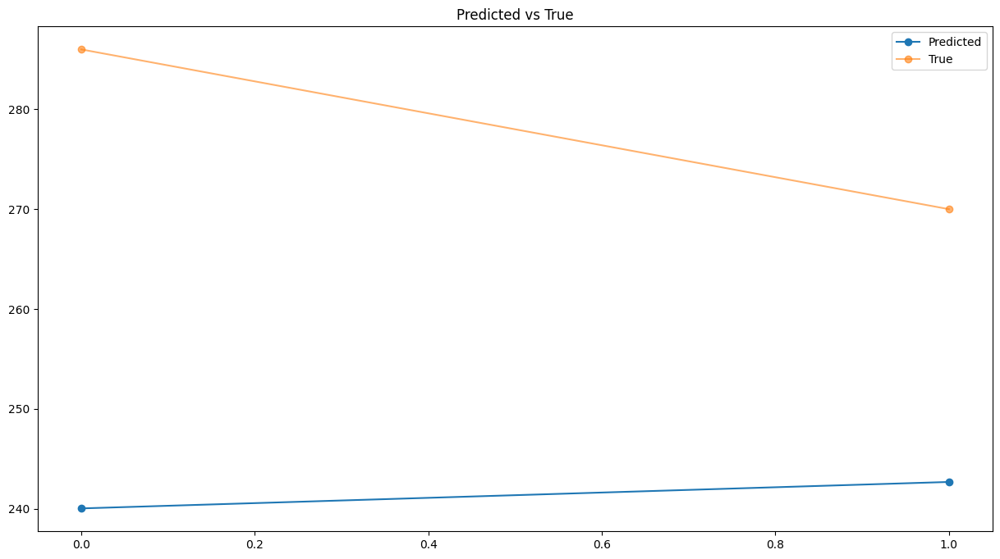

{'mae': 36.650169372558565,
 'mse': 37.81783862093686,
 'rmse': 1430.1889179592238}

In [60]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Stacked LSTM sin dropout

In [61]:
model = keras.models.load_model('modelos/'+paciente+'/stacked_NO_dropout.h5')

In [62]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [63]:
len(array_Ytest)

6201

194/194 [==============================] - 2s 7ms/step


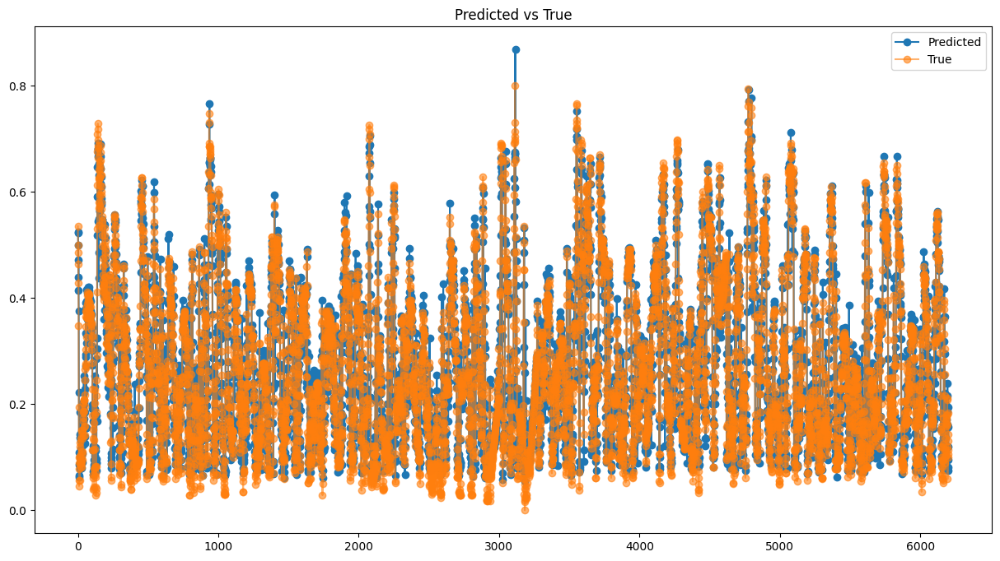

In [64]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [65]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.03532414074736366,
 'mse': 0.04938169676307439,
 'rmse': 0.002438551975200232}

In [66]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,281.047882
1,280.721985
2,269.856659
3,242.135071
4,256.807098
...,...
6196,74.193504
6197,129.122330
6198,94.922958
6199,83.664093


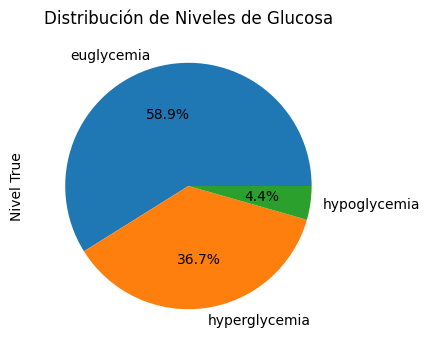

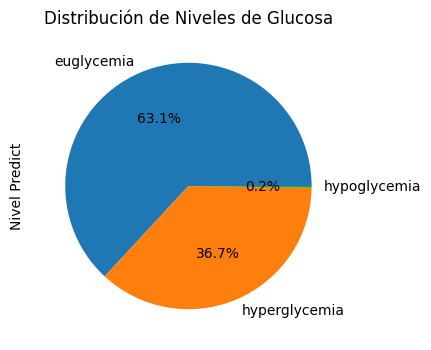

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,281.047882,hyperglycemia
1,270.0,hyperglycemia,280.721985,hyperglycemia
2,263.0,hyperglycemia,269.856659,hyperglycemia
3,253.0,hyperglycemia,242.135071,hyperglycemia
4,237.0,hyperglycemia,256.807098,hyperglycemia


In [67]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


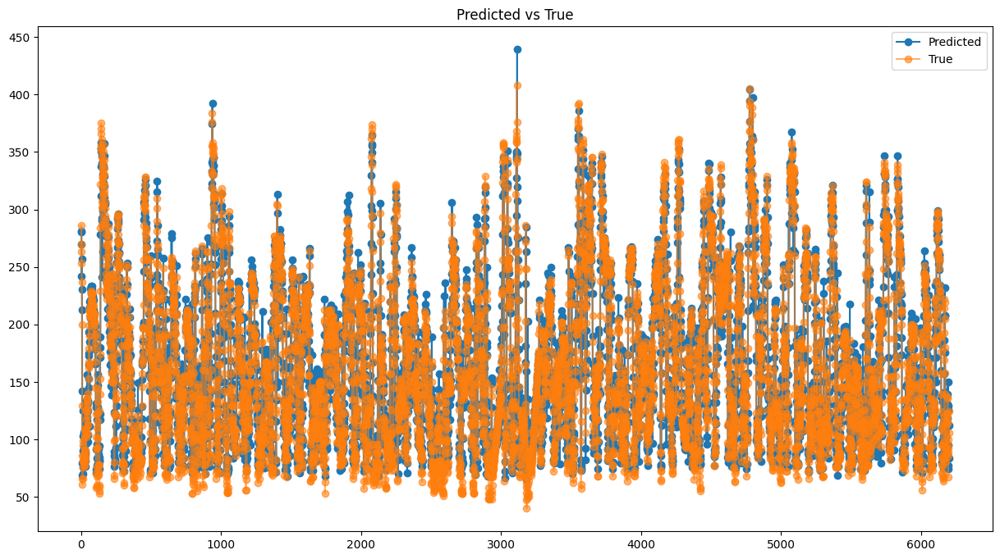

{'mae': 16.249104854064527,
 'mse': 22.715580699442604,
 'rmse': 515.9976065128894}

In [68]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [69]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [70]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,281.047882
2023-01-01 00:15:00,270.0,280.721985
2023-01-01 00:30:00,263.0,269.856659
2023-01-01 00:45:00,253.0,242.135071
2023-01-01 01:00:00,237.0,256.807098
...,...,...
2023-03-06 13:00:00,100.0,74.193504
2023-03-06 13:15:00,89.0,129.122330
2023-03-06 13:30:00,92.0,94.922958
2023-03-06 13:45:00,106.0,83.664093


AP, BE, EP: (0.8075806451612904, 0.12209677419354839, 0.0703225806451613)


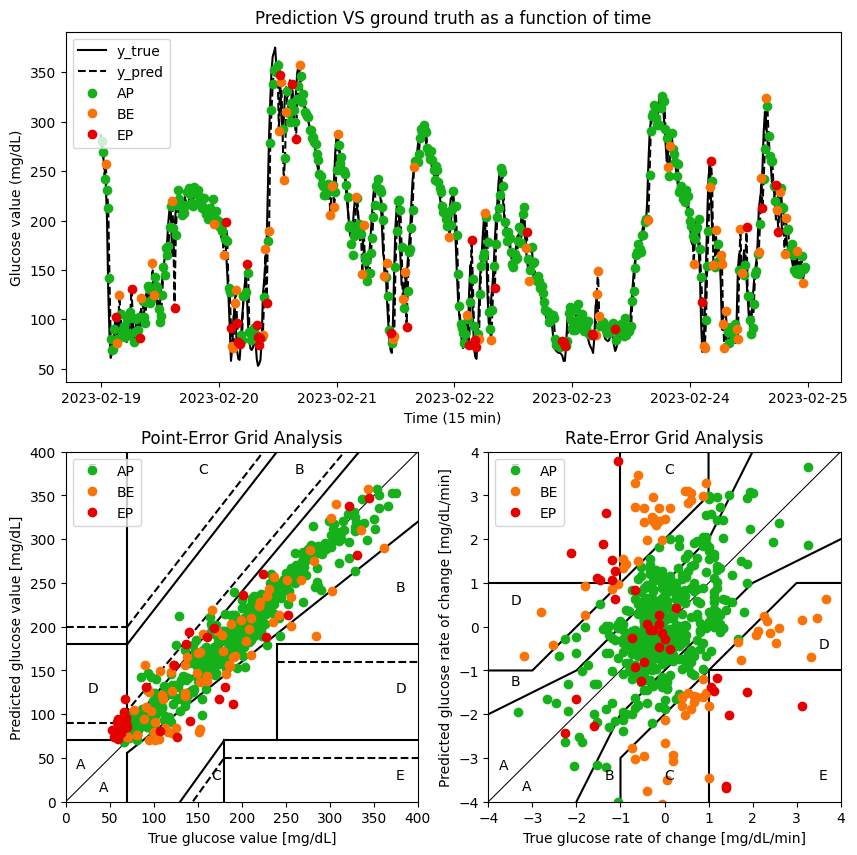

In [71]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [72]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,281.047882,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,280.721985,-1.066667,-0.021726,AP,A,B
2,2023-02-19 00:30:00,263.0,269.856659,-0.466667,-0.724355,AP,A,A
3,2023-02-19 00:45:00,253.0,242.135071,-0.666667,-1.848106,AP,A,B
4,2023-02-19 01:00:00,237.0,256.807098,-1.066667,0.978135,BE,A,uD
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,74.193504,0.933333,-0.186572,AP,B,B
6197,2023-04-24 13:15:00,89.0,129.122330,-0.733333,3.661922,BE,B,uC
6198,2023-04-24 13:30:00,92.0,94.922958,0.200000,-2.279958,BE,A,lC
6199,2023-04-24 13:45:00,106.0,83.664093,0.933333,-0.750591,AP,B,B


# Predicción a 60 min del conjunto de pruebas generales

In [73]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [74]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 24ms/step


,Glucose level Predict,Glucose level True
0,0.524017,0.534783
1,0.523309,0.500000


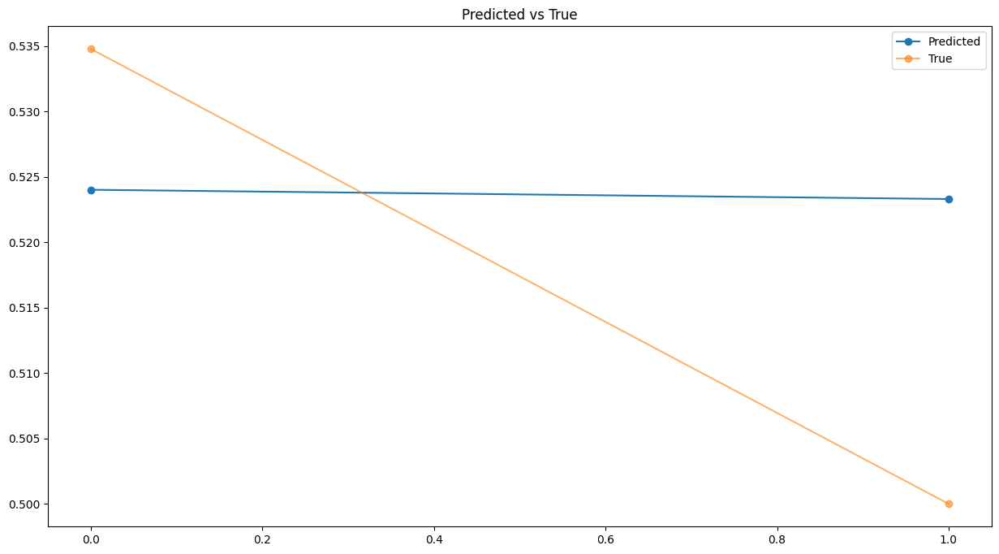

{'mae': 0.01703707394392595,
 'mse': 0.018154754508041035,
 'rmse': 0.0003295951112472363}

In [75]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [76]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,281.047882,286.0
1,280.721985,270.0


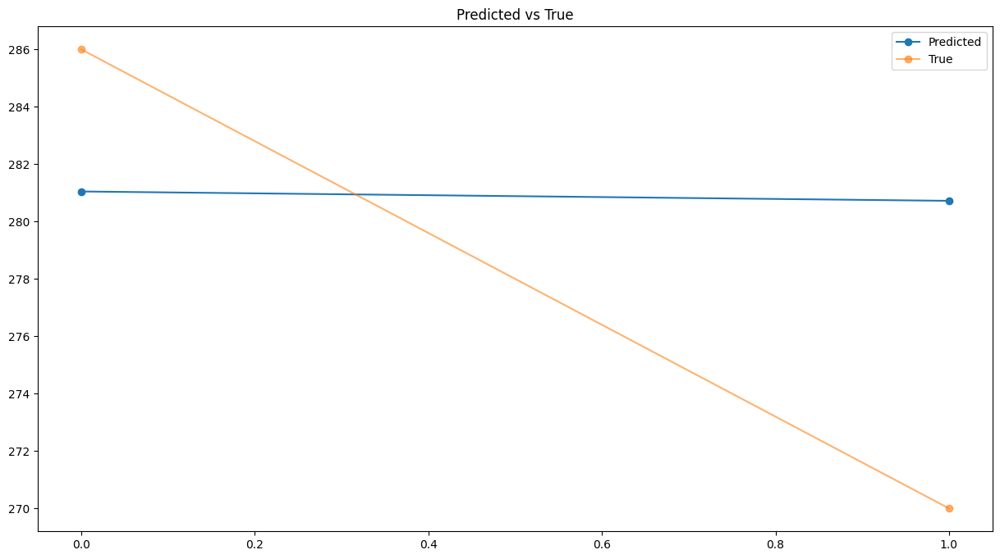

{'mae': 7.837051391601591, 'mse': 8.35118049443445, 'rmse': 69.74221565062241}

In [77]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Bidirectional LSTM con dropout

In [78]:
model = keras.models.load_model('modelos/'+paciente+'/bidirectional_dropout.h5')

In [79]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [80]:
len(array_Ytest)

6201

194/194 [==============================] - 1s 5ms/step


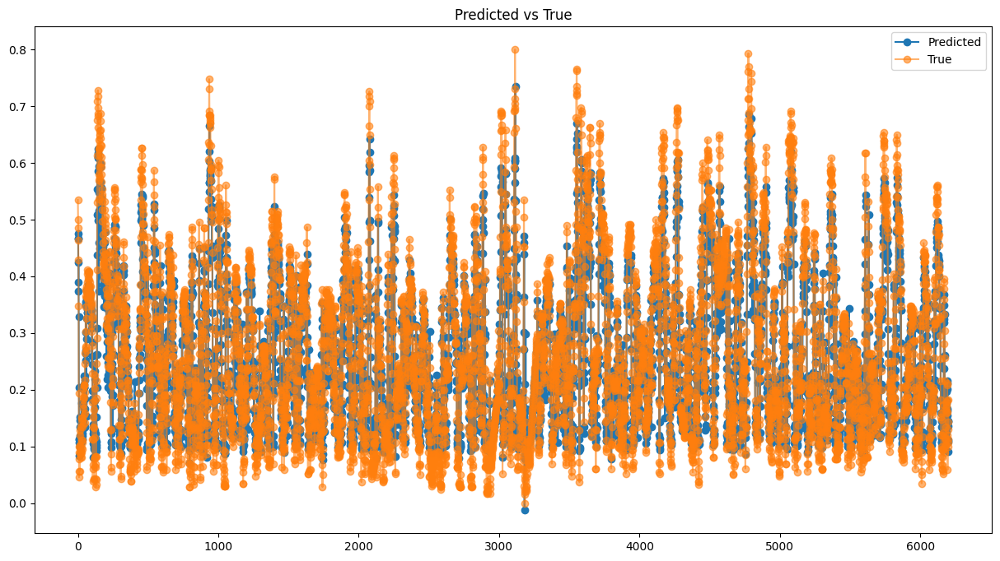

In [81]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [82]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.04230214267352765,
 'mse': 0.056761601935332716,
 'rmse': 0.0032218794542651667}

In [83]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,254.359116
1,258.650452
2,254.867859
3,219.507904
4,235.476578
...,...
6196,91.410347
6197,102.780624
6198,106.183800
6199,89.452675


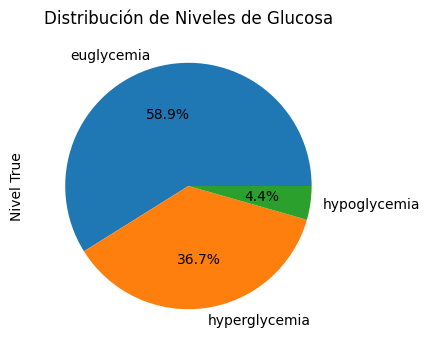

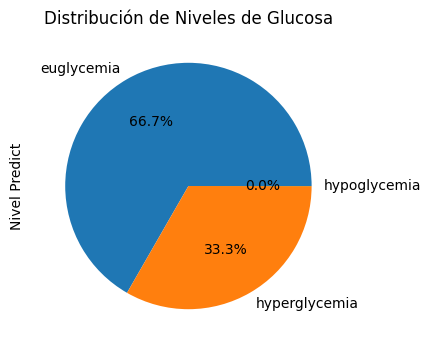

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,254.359116,hyperglycemia
1,270.0,hyperglycemia,258.650452,hyperglycemia
2,263.0,hyperglycemia,254.867859,hyperglycemia
3,253.0,hyperglycemia,219.507904,hyperglycemia
4,237.0,hyperglycemia,235.476578,hyperglycemia


In [84]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


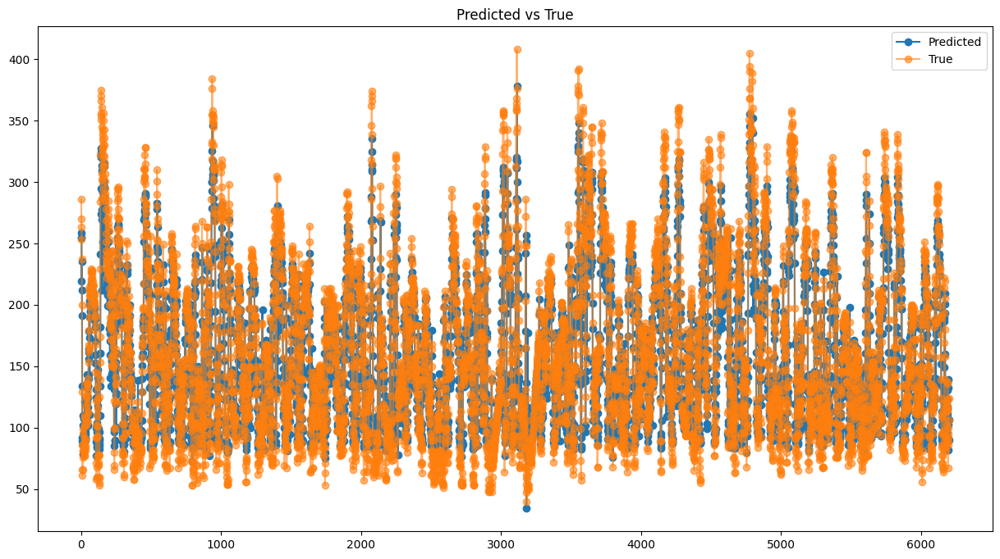

{'mae': 19.45898559188375, 'mse': 26.1103371558694, 'rmse': 681.749706393174}

In [85]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [86]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [87]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,254.359116
2023-01-01 00:15:00,270.0,258.650452
2023-01-01 00:30:00,263.0,254.867859
2023-01-01 00:45:00,253.0,219.507904
2023-01-01 01:00:00,237.0,235.476578
...,...,...
2023-03-06 13:00:00,100.0,91.410347
2023-03-06 13:15:00,89.0,102.780624
2023-03-06 13:30:00,92.0,106.183800
2023-03-06 13:45:00,106.0,89.452675


AP, BE, EP: (0.832741935483871, 0.09161290322580645, 0.07564516129032257)


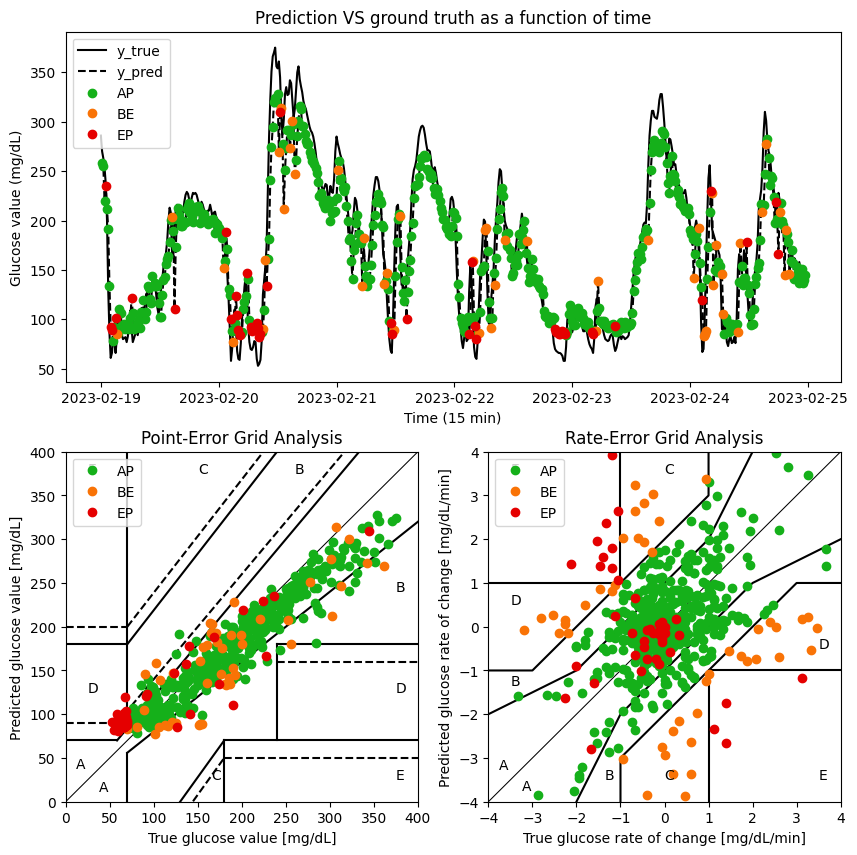

In [88]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [89]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,254.359116,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,258.650452,-1.066667,0.286089,AP,A,B
2,2023-02-19 00:30:00,263.0,254.867859,-0.466667,-0.252173,AP,A,A
3,2023-02-19 00:45:00,253.0,219.507904,-0.666667,-2.357330,AP,A,B
4,2023-02-19 01:00:00,237.0,235.476578,-1.066667,1.064578,EP,A,uE
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,91.410347,0.933333,0.659886,AP,A,A
6197,2023-04-24 13:15:00,89.0,102.780624,-0.733333,0.758018,AP,A,B
6198,2023-04-24 13:30:00,92.0,106.183800,0.200000,0.226878,AP,A,A
6199,2023-04-24 13:45:00,106.0,89.452675,0.933333,-1.115408,BE,A,lC


# Predicción a 60 min del conjunto de pruebas generales

In [90]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [91]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 21ms/step


,Glucose level Predict,Glucose level True
0,0.465998,0.534783
1,0.475327,0.500000


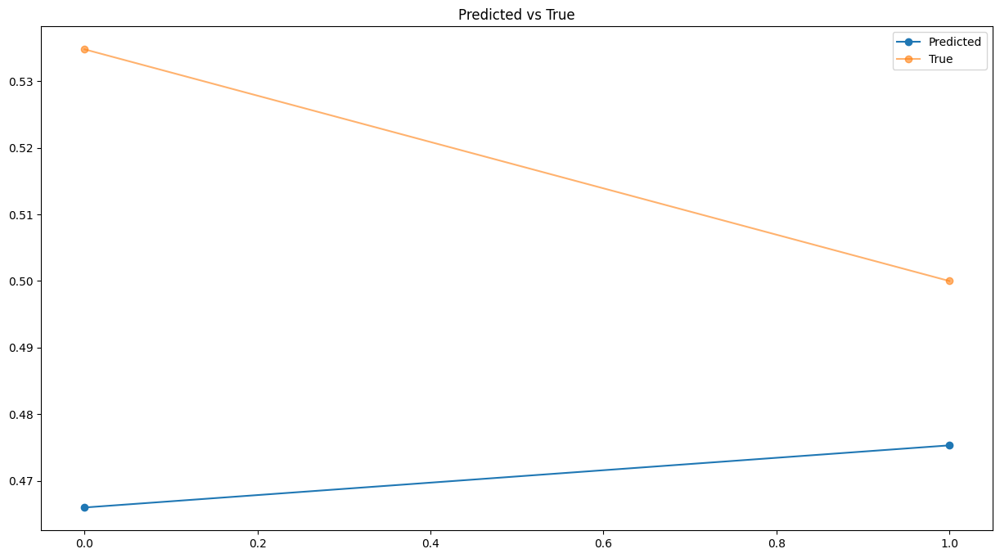

{'mae': 0.04672872540743456,
 'mse': 0.051672340515566496,
 'rmse': 0.0026700307743566546}

In [92]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [93]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,254.359116,286.0
1,258.650452,270.0


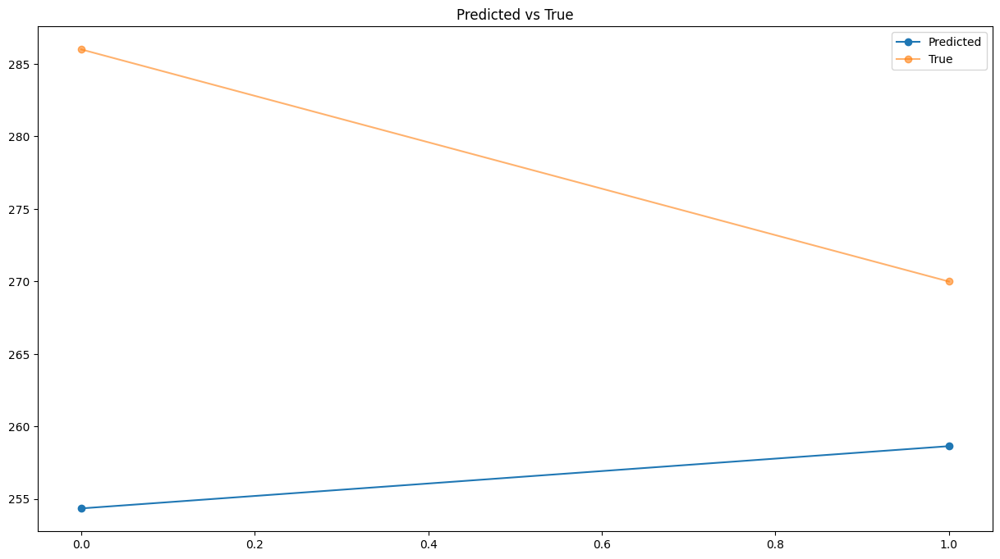

{'mae': 21.495216369628878,
 'mse': 23.769284939765573,
 'rmse': 564.9789065477664}

In [94]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Bidirectional LSTM sin dropout

In [95]:
model = keras.models.load_model('modelos/'+paciente+'/bidirectional_NO_dropout.h5')

In [96]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [97]:
len(array_Ytest)

6201

194/194 [==============================] - 1s 4ms/step


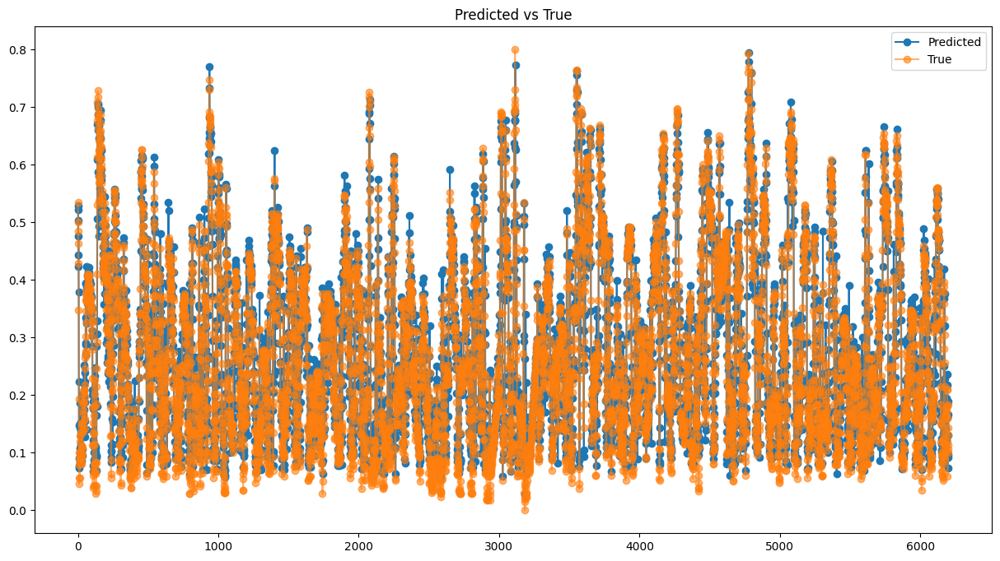

In [98]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [99]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.03577256786316004,
 'mse': 0.049843724848820554,
 'rmse': 0.0024843969068049318}

In [100]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,280.147949
1,283.564148
2,271.522583
3,244.086807
4,258.736969
...,...
6196,81.974266
6197,126.619987
6198,99.692528
6199,84.539246


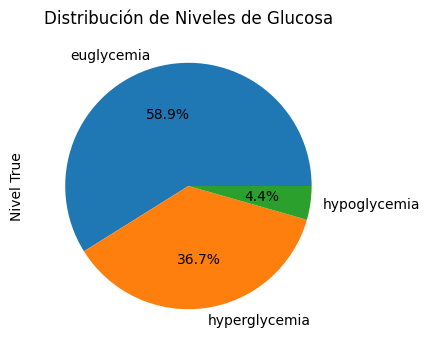

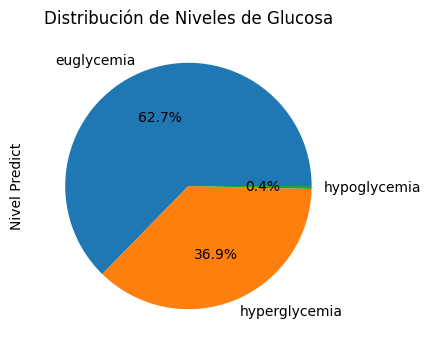

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,280.147949,hyperglycemia
1,270.0,hyperglycemia,283.564148,hyperglycemia
2,263.0,hyperglycemia,271.522583,hyperglycemia
3,253.0,hyperglycemia,244.086807,hyperglycemia
4,237.0,hyperglycemia,258.736969,hyperglycemia


In [101]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


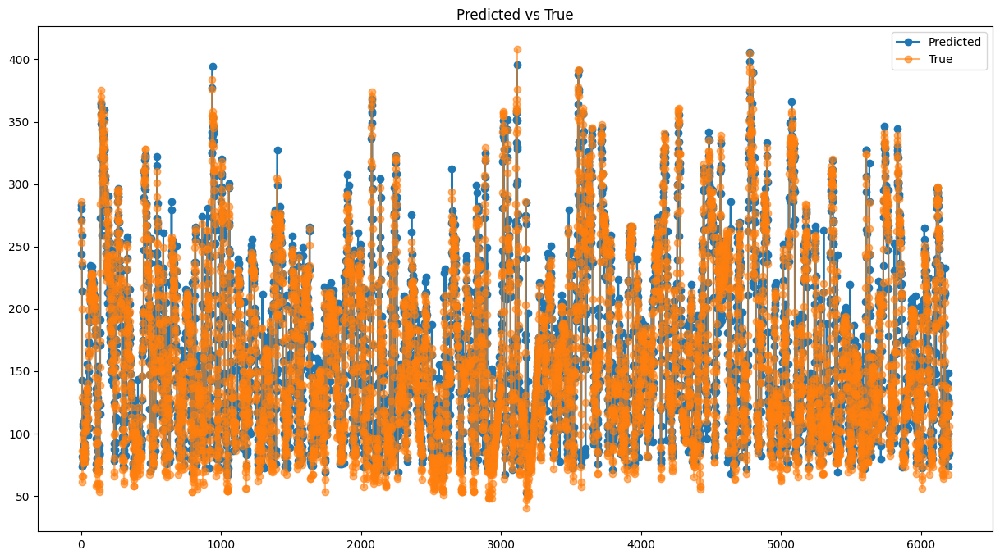

{'mae': 16.45538143120164, 'mse': 22.92811349042378, 'rmse': 525.6983882297529}

In [102]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [103]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [104]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,280.147949
2023-01-01 00:15:00,270.0,283.564148
2023-01-01 00:30:00,263.0,271.522583
2023-01-01 00:45:00,253.0,244.086807
2023-01-01 01:00:00,237.0,258.736969
...,...,...
2023-03-06 13:00:00,100.0,81.974266
2023-03-06 13:15:00,89.0,126.619987
2023-03-06 13:30:00,92.0,99.692528
2023-03-06 13:45:00,106.0,84.539246


AP, BE, EP: (0.812741935483871, 0.11951612903225807, 0.06774193548387097)


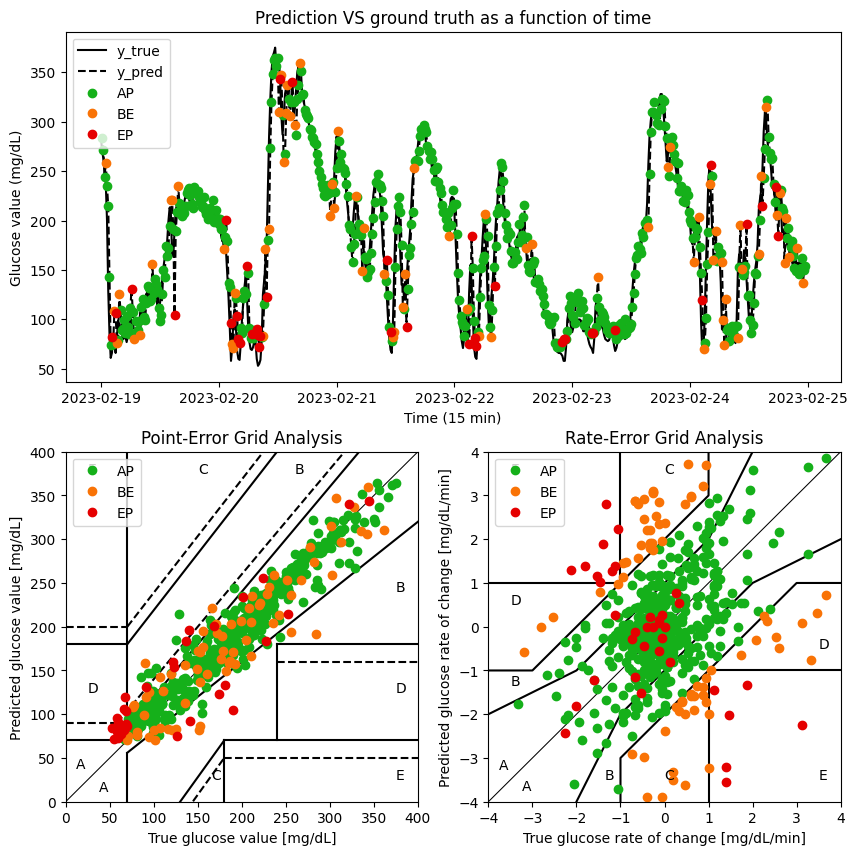

In [105]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [106]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,280.147949,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,283.564148,-1.066667,0.227747,AP,A,B
2,2023-02-19 00:30:00,263.0,271.522583,-0.466667,-0.802771,AP,A,A
3,2023-02-19 00:45:00,253.0,244.086807,-0.666667,-1.829052,AP,A,B
4,2023-02-19 01:00:00,237.0,258.736969,-1.066667,0.976677,BE,A,uD
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,81.974266,0.933333,0.548322,AP,A,A
6197,2023-04-24 13:15:00,89.0,126.619987,-0.733333,2.976382,BE,B,uC
6198,2023-04-24 13:30:00,92.0,99.692528,0.200000,-1.795164,AP,A,B
6199,2023-04-24 13:45:00,106.0,84.539246,0.933333,-1.010219,AP,B,B


# Predicción a 60 min del conjunto de pruebas generales

In [107]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [108]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 23ms/step


,Glucose level Predict,Glucose level True
0,0.522061,0.534783
1,0.529487,0.500000


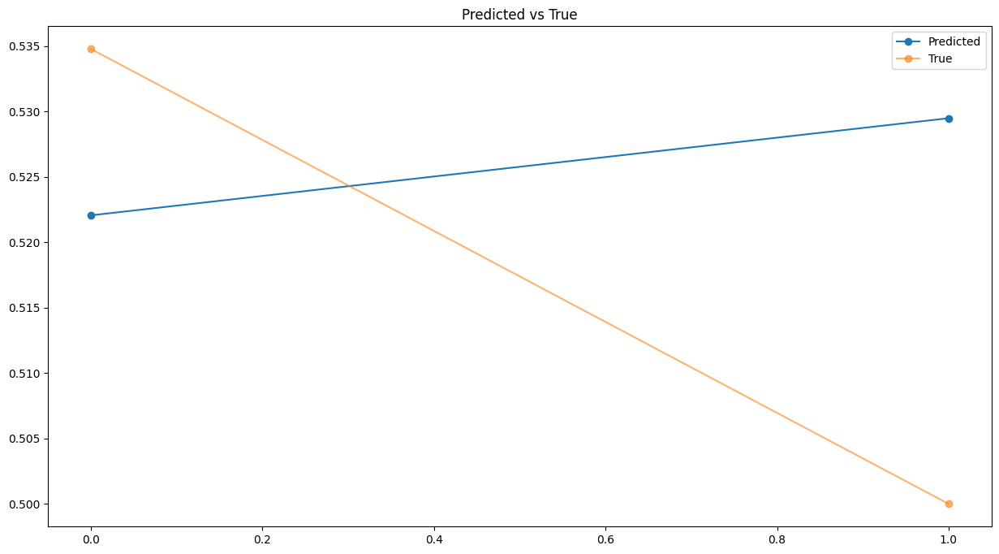

{'mae': 0.021104494903398607,
 'mse': 0.022708309662750076,
 'rmse': 0.0005156673277393485}

In [109]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [110]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,280.147919,286.0
1,283.564056,270.0


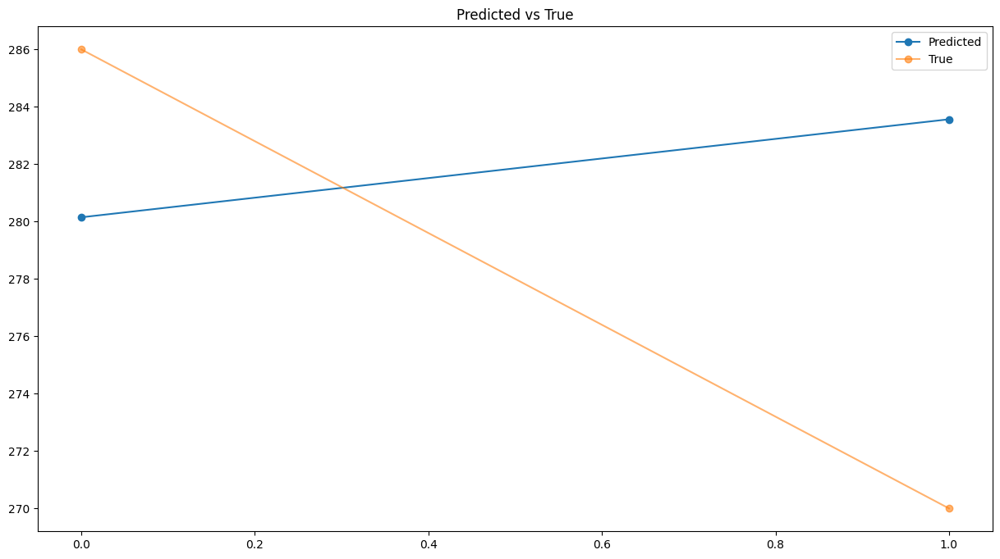

{'mae': 9.708068847656278,
 'mse': 10.445824080825412,
 'rmse': 109.11524072755205}

In [111]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)